In [ ]:
from google.colab import drive
drive.flush_and_unmount()
drive.mount('/content/drive', force_remount=False)

Mounted at /content/drive


In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
!unzip '/content/drive/MyDrive/TrafficSignData.zip' -d '/content/drive/MyDrive/TrafficSignData'

流式输出内容被截断，只能显示最后 5000 行内容。
  inflating: /content/drive/MyDrive/TrafficSignData/myData/8/00015_00010.jpg  
  inflating: /content/drive/MyDrive/TrafficSignData/myData/8/00015_00011.jpg  
  inflating: /content/drive/MyDrive/TrafficSignData/myData/8/00015_00012.jpg  
  inflating: /content/drive/MyDrive/TrafficSignData/myData/8/00015_00013.jpg  
  inflating: /content/drive/MyDrive/TrafficSignData/myData/8/00015_00014.jpg  
  inflating: /content/drive/MyDrive/TrafficSignData/myData/8/00015_00015.jpg  
  inflating: /content/drive/MyDrive/TrafficSignData/myData/8/00015_00016.jpg  
  inflating: /content/drive/MyDrive/TrafficSignData/myData/8/00015_00017.jpg  
  inflating: /content/drive/MyDrive/TrafficSignData/myData/8/00015_00018.jpg  
  inflating: /content/drive/MyDrive/TrafficSignData/myData/8/00015_00019.jpg  
  inflating: /content/drive/MyDrive/TrafficSignData/myData/8/00015_00020.jpg  
  inflating: /content/drive/MyDrive/TrafficSignData/myData/8/00015_00021.jpg  
  inflating: /content/dri

In [ ]:
import numpy as np
import pandas as pd
import os

In [ ]:
# 可視化
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style('whitegrid')
%matplotlib inline
from tensorflow.keras.utils import plot_model

# データの分割
from sklearn.model_selection import train_test_split

# 評価指標
from sklearn.metrics import confusion_matrix, classification_report

# ディープラーニング
import tensorflow as tf
print('TensoFlow Version: ', tf.__version__)
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, BatchNormalization, Dropout
from tensorflow.keras.applications.resnet import ResNet50

from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger

TensoFlow Version:  2.14.0


In [ ]:
path = '/content/drive/MyDrive/TrafficSignData'
lab = pd.read_csv('/content/drive/MyDrive/TrafficSignData/labels.csv')

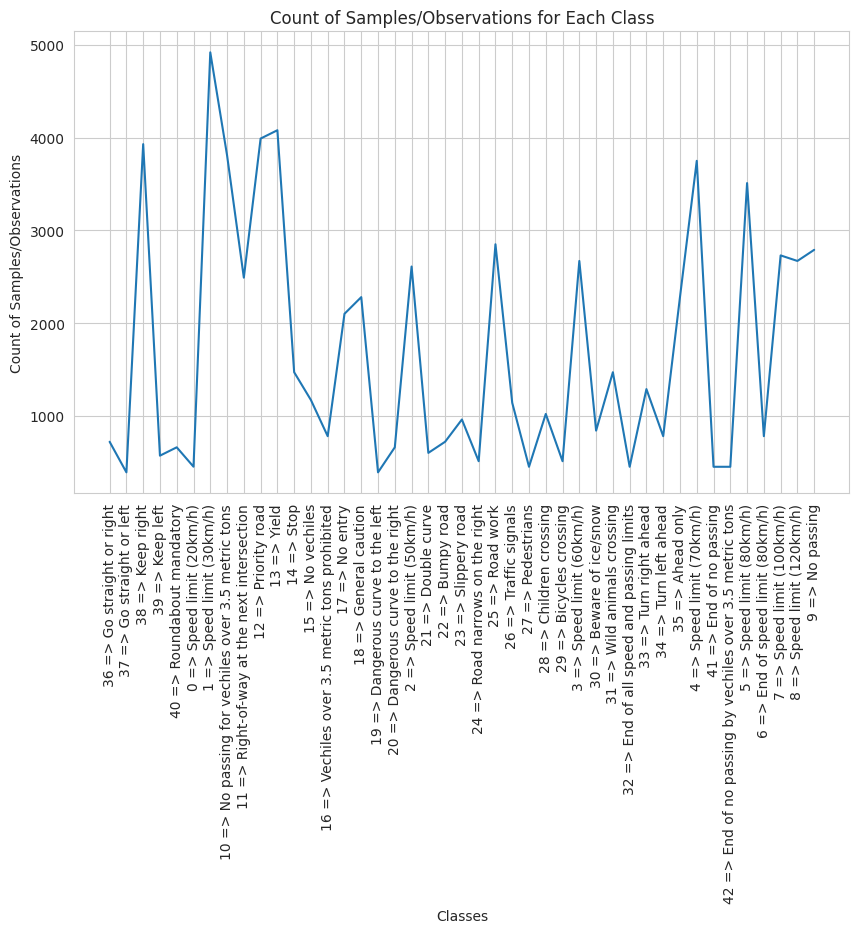

In [ ]:
d = dict()
class_labels = dict()

# 各フォルダー内のファイルの数
for dirs in os.listdir(path + '/myData'):
    count = len(os.listdir(path + '/myData/' + dirs))
    d[dirs + ' => ' + lab[lab.ClassId == int(dirs)].values[0][1]] = count
    class_labels[int(dirs)] = lab[lab.ClassId == int(dirs)].values[0][1]

plt.figure(figsize=(10, 6))
sns.lineplot(x=list(d.keys()), y=list(d.values()))

plt.title('Count of Samples/Observations for Each Class')
plt.xlabel('Classes')
plt.ylabel('Count of Samples/Observations')

plt.xticks(rotation=90)

plt.show()

In [ ]:
# 画像サイズを入力
img_rows, img_cols = 32, 32

# RGB画像
img_channels = 3
nb_classes = len(class_labels.keys())

# データを生成
datagen = ImageDataGenerator()

# データのフローを設定
data = datagen.flow_from_directory('/content/drive/MyDrive/TrafficSignData/myData',
                   target_size=(32, 32),
                   batch_size=73139,
                   class_mode='categorical',
                   shuffle=True )

Found 73139 images belonging to 43 classes.


In [ ]:
X , y = data.next()

In [ ]:
print(f"Data Shape :{X.shape}\nLabels shape :{y.shape}")

Data Shape :(73139, 32, 32, 3)
Labels shape :(73139, 43)


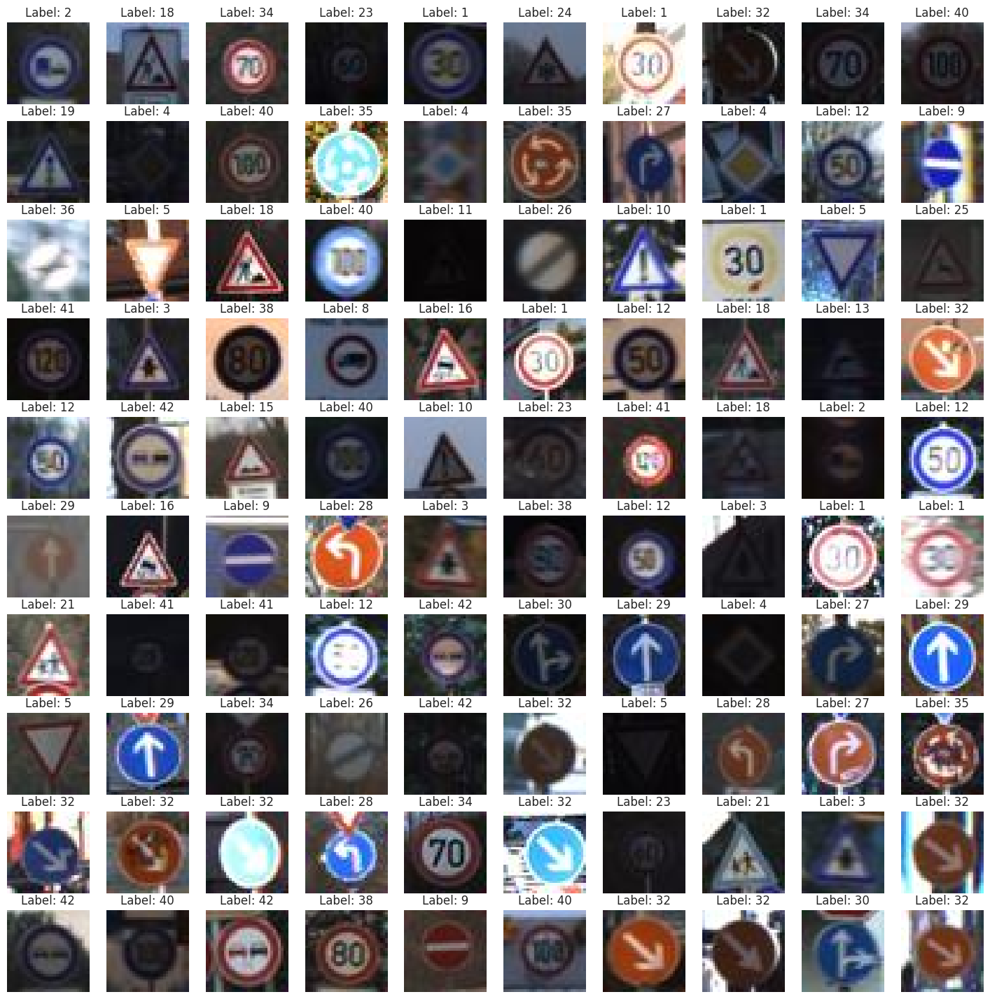

In [ ]:
# 対応するラベルを表示する
fig, axes = plt.subplots(10,10, figsize=(18,18))
for i,ax in enumerate(axes.flat):
    r = np.random.randint(X.shape[0])
    ax.imshow(X[r].astype('uint8'))
    ax.grid(False)
    ax.axis('off')
    ax.set_title('Label: '+str(np.argmax(y[r])))

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=11)

In [ ]:
print("Train Shape: {}\nTest Shape : {}".format(X_train.shape, X_test.shape))

Train Shape: (58511, 32, 32, 3)
Test Shape : (14628, 32, 32, 3)


In [ ]:
resnet = ResNet50(weights= None, include_top=False, input_shape= (img_rows,img_cols,img_channels))

In [ ]:
x = resnet.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(nb_classes, activation= 'softmax')(x)
model = Model(inputs = resnet.input, outputs = predictions)

x = Dropout(0.5)(x)：ドロップアウト確率が高くなると (0.5 など)、トレーニング中のモデルの堅牢性がより重視され、過剰適合のリスクが軽減されますが、モデルの過小適合につながる可能性もあります。 ドロップアウト確率が低い (0.2 または 0.3 など) と、ニューロン間のより多くの情報伝達を維持できますが、過学習につながりやすくなります。

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 32, 32, 3)]          0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 38, 38, 3)            0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 16, 16, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 16, 16, 64)           256       ['conv1_conv[0][0]']          
 on)                                                                                          

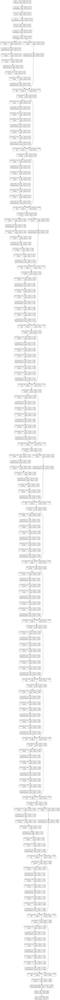

In [ ]:
plot_model(model, show_layer_names=True, show_shapes =True, to_file='/content/drive/MyDrive/TrafficSignData/model.png', dpi=100)

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model_check = ModelCheckpoint('/content/drive/MyDrive/TrafficSignData/best_model.h5', monitor='val_accuracy', verbose=0, save_best_only=True, mode='max')
# # ベストなモデルを保存するためのコールバック

early = EarlyStopping(monitor='val_accuracy', min_delta=0, patience=5, verbose=0, mode='max', restore_best_weights=True)
# EarlyStoppingコールバック。val_accuracyの改善が5エポック連続で見られない場合に学習を終了し、最良の重みを復元する。

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)
# ReduceLROnPlateauコールバック。val_lossの改善が5エポック連続で見られない場合に学習率を0.2倍に減少させる。

csv_logger = CSVLogger('/content/drive/MyDrive/TrafficSignData/train_log.csv', separator=',')
# 学習ログをCSVファイルに保存するためのコールバック。

In [ ]:
n_epochs = 34
history =  model.fit(X_train, y_train,  batch_size = 32, epochs = n_epochs, verbose = 1,
              validation_data = (X_test, y_test), callbacks = [model_check, early, reduce_lr, csv_logger])

Epoch 1/34
1829/1829 [==============================] - ETA: 0s - loss: 3.6209 - accuracy: 0.3001

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1829/1829 [==============================] - 123s 47ms/step - loss: 3.6209 - accuracy: 0.3001 - val_loss: 7560.1958 - val_accuracy: 0.0524 - lr: 0.0010
Epoch 2/34
1829/1829 [==============================] - 76s 41ms/step - loss: 2.9917 - accuracy: 0.3351 - val_loss: 2.1510 - val_accuracy: 0.6039 - lr: 0.0010
Epoch 3/34
1829/1829 [==============================] - 74s 40ms/step - loss: 2.0145 - accuracy: 0.5450 - val_loss: 3.0320 - val_accuracy: 0.1894 - lr: 0.0010
Epoch 4/34
1829/1829 [==============================] - 74s 41ms/step - loss: 1.9187 - accuracy: 0.5381 - val_loss: 20.8062 - val_accuracy: 0.5187 - lr: 0.0010
Epoch 5/34
1829/1829 [==============================] - 76s 41ms/step - loss: 1.4460 - accuracy: 0.6429 - val_loss: 0.9817 - val_accuracy: 0.6890 - lr: 0.0010
Epoch 6/34
1829/1829 [==============================] - 76s 41ms/step - loss: 0.7404 - accuracy: 0.7859 - val_loss: 0.4060 - val_accuracy: 0.8705 - lr: 0.0010
Epoch 7/34
1829/1829 [==============================

In [ ]:
# 保存する
model.save('/content/drive/MyDrive/TrafficSignData/TSC_model.h5')

In [ ]:
# モデルのテストデータでの評価
loss, acc = model.evaluate(X_test, y_test)
print('Accuracy: ', acc, '\nLoss    : ', loss)

458/458 [==============================] - 5s 11ms/step - loss: 0.0255 - accuracy: 0.9924
Accuracy:  0.9924117922782898 
Loss    :  0.025494087487459183


モデルの訓練が進行するにつれて、精度が向上し、損失が減少する様子を視覚化

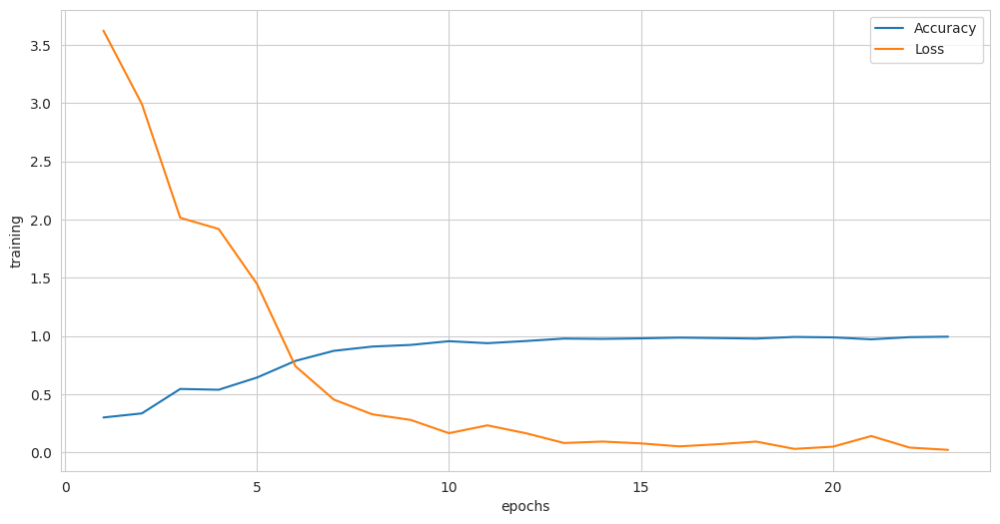

In [ ]:
# エポック数
q = len(list(history.history['loss']))
plt.figure(figsize=(12, 6))

#トレーニング精度と損失の曲線をプロット
sns.lineplot(x = range(1, 1+q), y = history.history['accuracy'], label = 'Accuracy')
sns.lineplot(x = range(1, 1+q), y = history.history['loss'], label = 'Loss')

# x軸とy軸のラベルを設定
plt.xlabel('epochs')
plt.ylabel('training')
plt.legend();

"トレーニング精度"と "検証精度" の折れ線グラフ；
train_datasetで、（正解数/総数）・100％；
test_datasetで、（正解数/総数）・100％

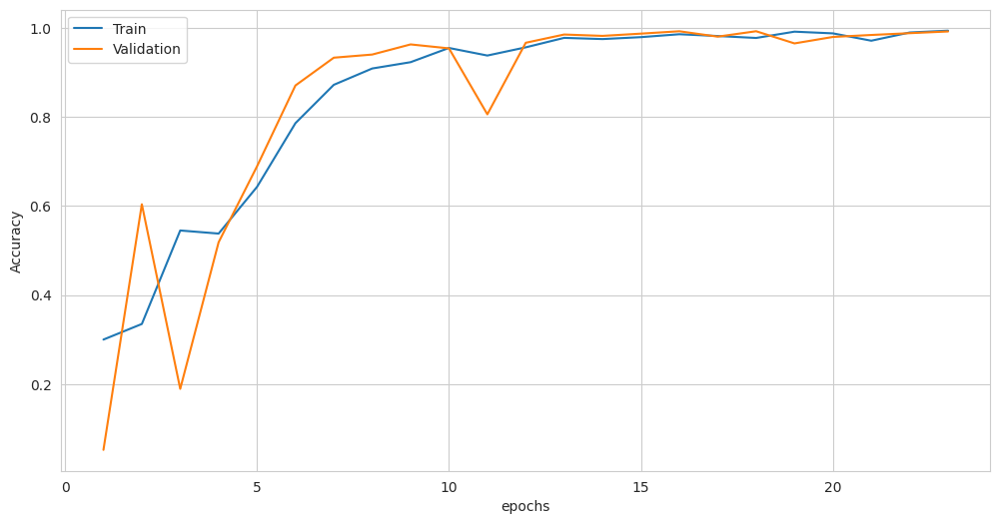

In [ ]:
plt.figure(figsize=(12, 6))
sns.lineplot(x = range(1, 1+q), y = history.history['accuracy'], label = 'Train')
sns.lineplot(x = range(1, 1+q), y = history.history['val_accuracy'], label = 'Validation')
plt.xlabel('epochs')
plt.ylabel('Accuracy')
plt.legend();

In [ ]:
# 推論時間
%%time
pred = np.argmax(model.predict(X_test), axis = 1)

458/458 [==============================] - 5s 9ms/step
CPU times: user 5.68 s, sys: 321 ms, total: 6 s
Wall time: 5.64 s


混同行列から計算された各クラスの正解率、適合率、再現率、F1スコアなどの分類レポートを生成し、表示します。
正解率：正解数を総サンプル数で割った値である。
適合率（Precision）：モデルが特定のクラスを正しく分類した割合を示す。
再現率（Recall）：実際に陽性のサンプルのうち、モデルが正しく陽性と分類した割合を示す。
f1-score：適合率と再現率の調和平均である。
support：以下の合計
真正例（True Positives，TP）：モデルが正のクラスと予測して正しく予測したサンプルの数。
偽正例（False Positives，FP）：モデルが誤って正のクラスと予測したサンプルの数。
真負例（True Negatives，TN）：モデルが負のクラスと予測して正しく予測したサンプルの数。
偽負例（False Negatives，FN）：モデルが誤って負のクラスと予測したサンプルの数。

In [ ]:
# クラスラベルのリストを作成
labels = [class_labels[i] for i in range(43)]

# 分類レポートを表示
print("分類レポート:")
report = classification_report(np.argmax(y_test, axis = 1), pred, target_names = labels)
print(report)

分類レポート:
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.99      0.98      0.98        84
                              Speed limit (30km/h)       0.98      1.00      0.99      1022
                              Speed limit (50km/h)       1.00      1.00      1.00       776
                              Speed limit (60km/h)       1.00      0.99      1.00       503
                              Speed limit (70km/h)       1.00      1.00      1.00       805
                              Speed limit (80km/h)       1.00      1.00      1.00       785
                       End of speed limit (80km/h)       1.00      1.00      1.00       295
                             Speed limit (100km/h)       1.00      1.00      1.00       227
                             Speed limit (120km/h)       1.00      1.00      1.00       172
                                        No passing       1.00      1.00

In [ ]:
# 混同行列（confusion matrix）を計算
cmat = confusion_matrix(np.argmax(y_test, axis=1), pred)

# クラスごとの正解率を計算
classwise_acc = cmat.diagonal() / cmat.sum(axis=1) * 100

# 正解率をDataFrameに格納
cls_acc = pd.DataFrame({'Class_Label': [class_labels[i] for i in range(43)], 'Accuracy': classwise_acc.tolist()}, columns=['Class_Label', 'Accuracy'])

# 正解率の表を表示
cls_acc.style.format({"正解率": "{:,.2f}", }).hide_index()

<ipython-input-27-27ab54bcf9a3>:11: FutureWarning: this method is deprecated in favour of `Styler.hide(axis="index")`
  cls_acc.style.format({"正解率": "{:,.2f}", }).hide_index()


Class_Label,Accuracy
Speed limit (20km/h),97.619048
Speed limit (30km/h),99.804305
Speed limit (50km/h),99.613402
Speed limit (60km/h),99.403579
Speed limit (70km/h),99.875776
Speed limit (80km/h),100.000000
End of speed limit (80km/h),100.000000
Speed limit (100km/h),100.000000
Speed limit (120km/h),100.000000
No passing,99.746193


In [ ]:
!pip install matplotlib
import matplotlib.pyplot as plt

1/1 [==============================] - 0s 21ms/step


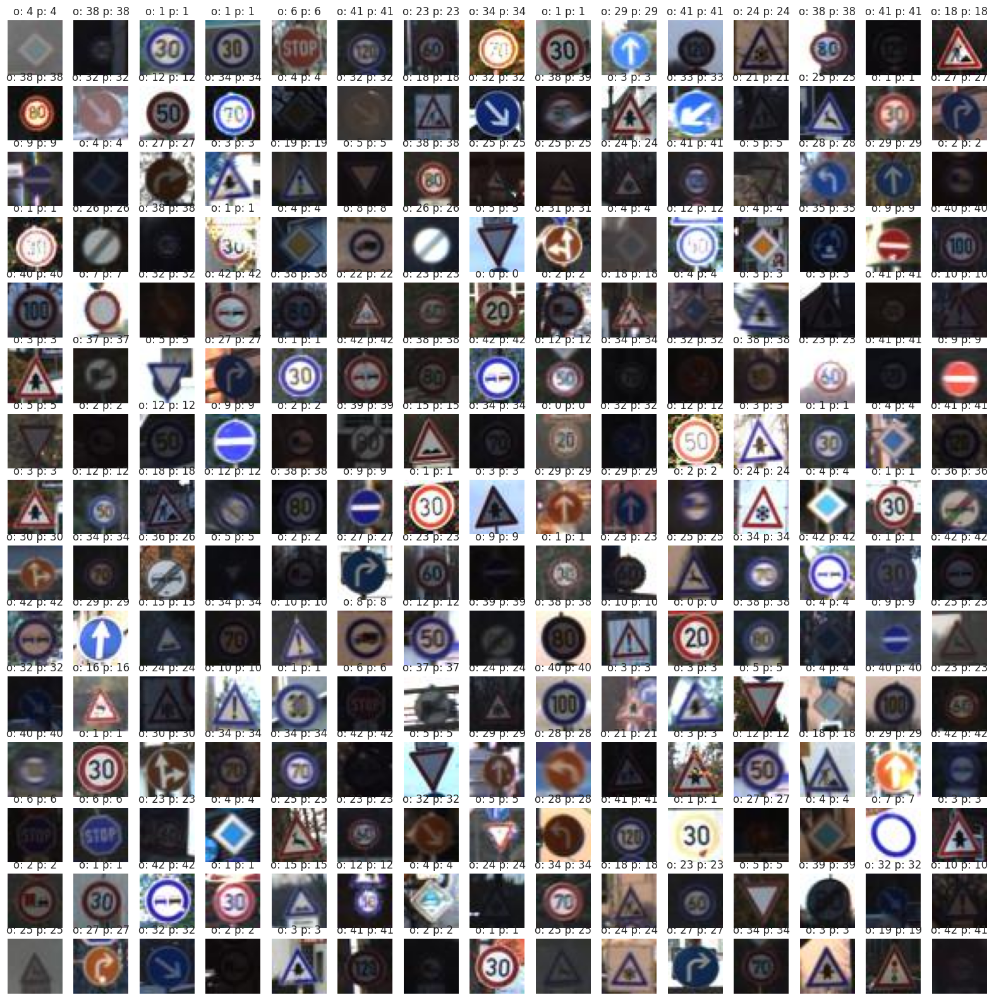

In [ ]:
import matplotlib.pyplot as plt

title_format = 'o: {} p: {}'

# 画像を表示するためのサブプロットを作成
fig, axes = plt.subplots(15, 15, figsize=(20, 20))
for i, ax in enumerate(axes.flat):
    r = np.random.randint(X_test.shape[0])
    ax.imshow(X_test[r].astype('uint8'))
    ax.grid(False)
    ax.axis('off')
    # タイトルに実際のクラスと予測クラスを表示
    ax.set_title(title_format.format(np.argmax(y_test[r]), np.argmax(model.predict(X_test[r].reshape(1, 32, 32, 3)))))

1/1 [==============================] - 0s 21ms/step


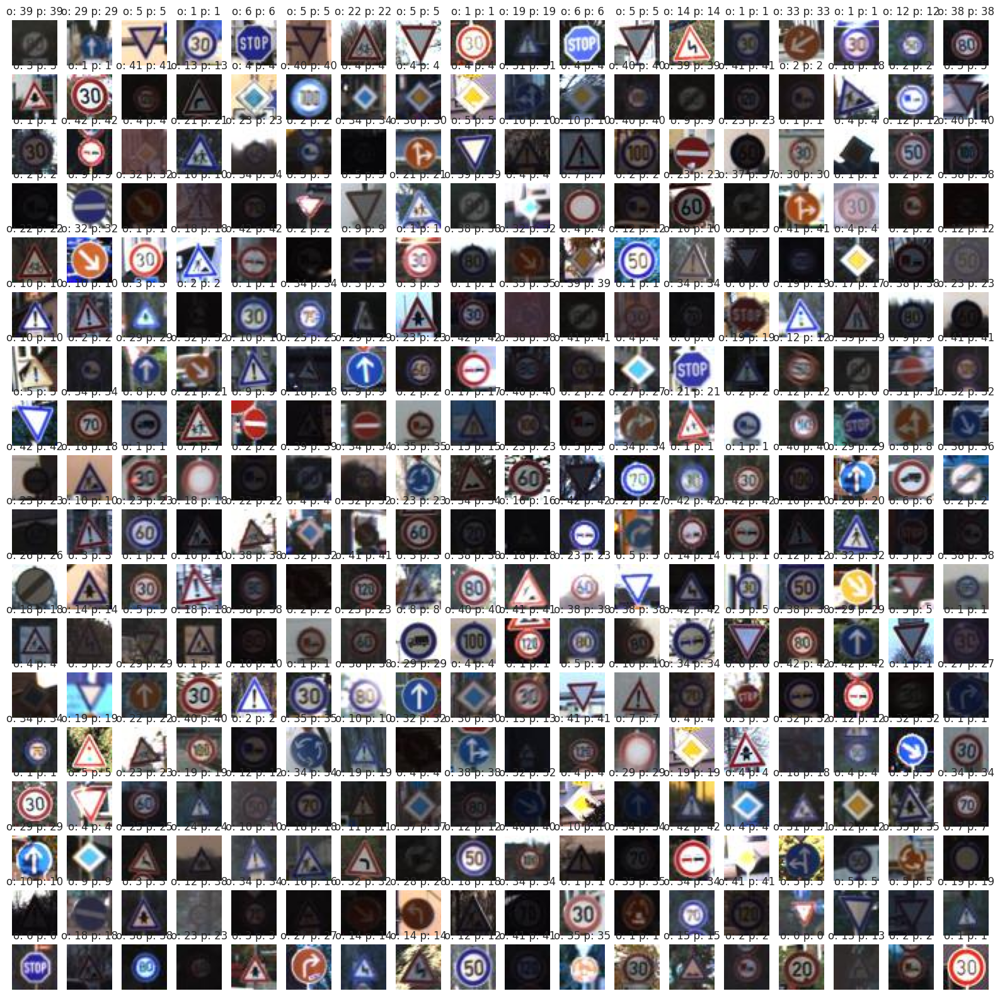

In [ ]:
import matplotlib.pyplot as plt

title_format = 'o: {} p: {}'

# 画像を表示するためのサブプロットを作成
fig, axes = plt.subplots(18, 18, figsize=(20, 20))
for i, ax in enumerate(axes.flat):
    r = np.random.randint(X_test.shape[0])
    ax.imshow(X_test[r].astype('uint8'))
    ax.grid(False)
    ax.axis('off')
    # タイトルに実際のクラスと予測クラスを表示
    ax.set_title(title_format.format(np.argmax(y_test[r]), np.argmax(model.predict(X_test[r].reshape(1, 32, 32, 3)))))

458/458 [==============================] - 5s 9ms/step


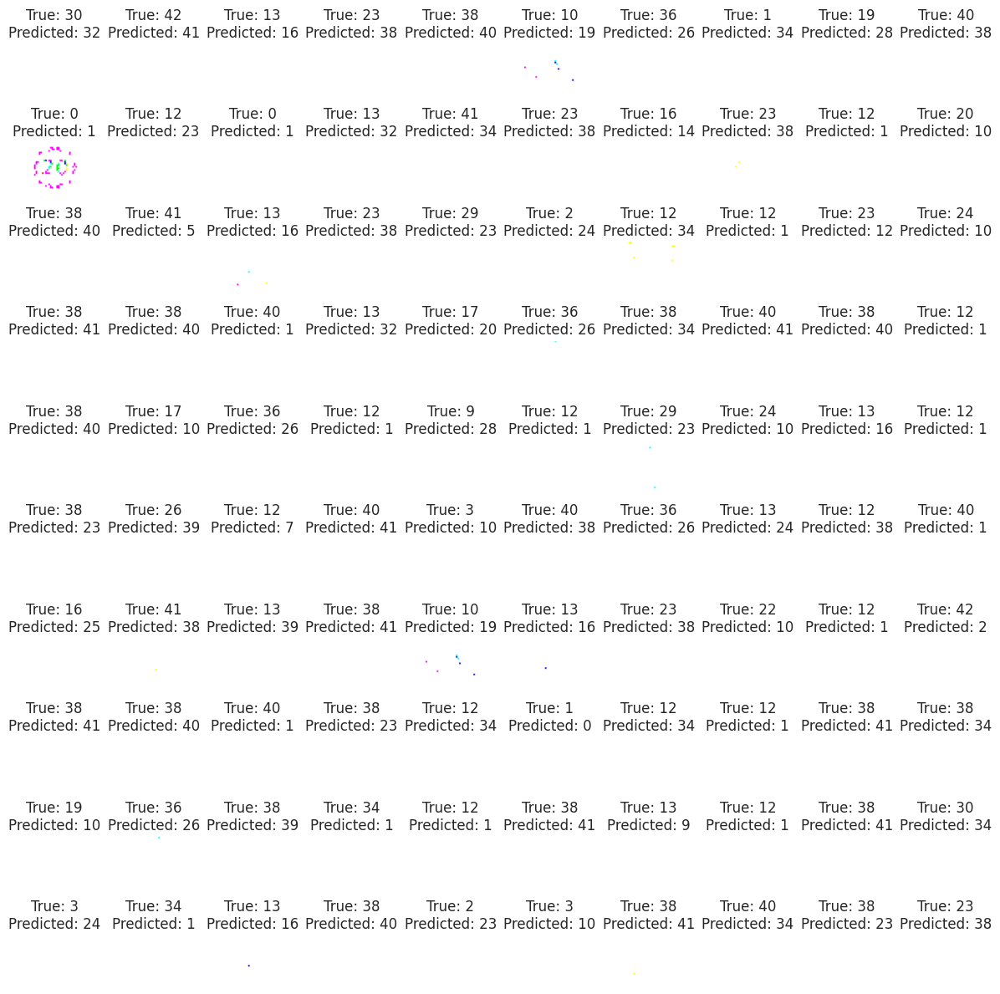

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# モデル
model = tf.keras.models.load_model('/content/drive/MyDrive/TrafficSignData/TSC_model.h5')

# モデルを使用して予測
predictions = model.predict(X_test)

misclassified_images = []
misclassified_labels = []

# 誤認された画像を見つける
for i in range(len(predictions)):
    predicted_label = np.argmax(predictions[i])
    true_label = np.argmax(y_test[i])
    if predicted_label != true_label:
        misclassified_images.append(X_test[i])
        misclassified_labels.append((true_label, predicted_label))

# 行列の設定
num_rows = 10
num_columns = 10

# 画像サブグラフのグリッドを作成
fig, axes = plt.subplots(num_rows, num_columns, figsize=(12, 12))

# 誤認識された画像をループして表示
for i in range(num_rows):
    for j in range(num_columns):
        if len(misclassified_images) > i * num_columns + j:
            ax = axes[i, j]
            ax.imshow(misclassified_images[i * num_columns + j])
            ax.set_title(f'True: {misclassified_labels[i * num_columns + j][0]}\nPredicted: {misclassified_labels[i * num_columns + j][1]}')
            ax.axis('off')

# show
plt.tight_layout()
plt.show()